<a href="https://colab.research.google.com/github/Fatim-Sohail/squash-ai/blob/main/Squash_Ball_Detection_YOLO_WORLD_SAM_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setting up the environment
#### **NOTE: Restart the environment when promted and before running the next cell**

In [ ]:
# Step 1 Clone Grounding SAM 2 repository
!git clone https://github.com/IDEA-Research/Grounded-SAM-2.git
%cd Grounded-SAM-2

# Step 2 Download the pretrained SAM 2 checkpoints:
%cd checkpoints
!bash download_ckpts.sh

# Step 3 Download the pretrained Grounding DINO checkpoints:
%cd ../gdino_checkpoints
!bash download_ckpts.sh

# Step 4_Set CUDA_HOME
# Find path to cuda
!whereis nvcc
%env CUDA_HOME /usr/local/cuda-12.2

# Step 5 Install SAM 2
%cd ..
!pip install -e .

Cloning into 'Grounded-SAM-2'...
remote: Enumerating objects: 1416, done.
remote: Counting objects: 100% (382/382), done.
remote: Compressing objects: 100% (113/113), done.
remote: Total 1416 (delta 320), reused 278 (delta 269), pack-reused 1034 (from 1)
Receiving objects: 100% (1416/1416), 157.85 MiB | 14.17 MiB/s, done.
Resolving deltas: 100% (467/467), done.
Updating files: 100% (838/838), done.
/content/Grounded-SAM-2
/content/Grounded-SAM-2/checkpoints
--2024-12-10 09:39:00--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.225.4.39, 13.225.4.116, 13.225.4.45, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.225.4.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156008466 (149M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2.1_hiera_tiny.pt’

sam2.1_hiera_tiny.p 100%[===================>] 148.78M   153MB/s    in 1.0s    

2024-12-10 0

In [ ]:
# Step 6 Install Grounding DINO
%cd Grounded-SAM-2
!pip install --no-build-isolation -e grounding_dino

# Step 7 Install other dependencies
!pip install supervision addict yapf ultralytics

[Errno 2] No such file or directory: 'Grounded-SAM-2'
/content/Grounded-SAM-2
Obtaining file:///content/Grounded-SAM-2/grounding_dino
  Preparing metadata (setup.py) ... done
  Running setup.py develop for groundingdino
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 54.0 MB/s eta 0:00:00


## Download the Dataset

In [ ]:
!pip install -q ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.7 MB/s eta 0:00:00


In [ ]:
from roboflow import Roboflow

In [ ]:

!mkdir {HOME}/datasets
%cd {HOME}/datasets

rf = Roboflow(api_key="PZEFEgAlCV2dgbe35jU9")

project = rf.workspace("weone").project("squash_ball_detection-cujh2")
version = project.version(1)
dataset = version.download("yolov8")

mkdir: cannot create directory ‘{HOME}/datasets’: No such file or directory
[Errno 2] No such file or directory: '{HOME}/datasets'
/content/Grounded-SAM-2
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to squash_ball_detection-1 in yolov8:: 100%|██████████| 748/748 [00:00<00:00, 5582.65it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# !wget https://www.dropbox.com/scl/fi/2n3vg5vyz37ca7tobctn5/robot_almost_back_closer_180.zip?rlkey=r5taos4eze5gdawfenz4atoo5&st=5olsho6v&dl=0
# !mv robot_almost_back_closer_180.zip?rlkey=r5taos4eze5gdawfenz4atoo5 robot_almost_back_closer_180.zip
# !unzip robot_almost_back_closer_180.zip

## Imports

In [ ]:
import os
import cv2
import json
import torch
import numpy as np
import supervision as sv
import matplotlib.pyplot as plt
import pycocotools.mask as mask_util
from pathlib import Path
from ultralytics import YOLO
from torchvision.ops import nms
from torchvision.ops import box_convert
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from grounding_dino.groundingdino.util.inference import load_model, load_image, predict

## Helper Functions

In [ ]:
def inference(text, img_path):
    image_source, image = load_image(img_path)

    sam2_predictor.set_image(image_source)

    boxes, confidences, labels = predict(
        model=grounding_model,
        image=image,
        caption=text,
        box_threshold=BOX_THRESHOLD,
        text_threshold=TEXT_THRESHOLD,
    )

    # Process the box prompt for SAM 2
    h, w, _ = image_source.shape
    boxes = boxes * torch.tensor([w, h, w, h])
    input_boxes = box_convert(boxes=boxes, in_fmt="cxcywh", out_fmt="xyxy")

    if torch.cuda.get_device_properties(0).major >= 8:
        # Enable TensorFloat-32 for Ampere GPUs
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True

    masks, scores, logits = sam2_predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_boxes.numpy(),
        multimask_output=False,
    )

    # Convert masks to the shape (n, H, W)
    if masks.ndim == 4:
        masks = masks.squeeze(1)

    # Apply Non-Maximum Suppression (NMS)
    nms_indices = nms(input_boxes, confidences, iou_threshold=0.5)
    input_boxes = input_boxes[nms_indices]
    masks = masks[nms_indices]
    confidences = confidences[nms_indices]
    class_names = [labels[i] for i in nms_indices]

    # Merge overlapping boxes and masks
    merged_boxes = []
    used_indices = set()

    for i, box in enumerate(input_boxes):
        if i in used_indices:
            continue
        overlapping_indices = [i]
        for j in range(i + 1, len(input_boxes)):
            if j in used_indices:
                continue
            iou = calculate_iou(box, input_boxes[j])
            if iou > 0.5:
                overlapping_indices.append(j)
                used_indices.add(j)
        # Merge boxes
        merged_box = merge_boxes(input_boxes[overlapping_indices])
        merged_boxes.append(merged_box)

    merged_boxes = torch.stack(merged_boxes)

    # Prepare labels
    labels = [
        f"{class_names[i]} {confidences[i]:.2f}"
        for i in range(len(merged_boxes))
    ]

    # Assuming 'masks' is the array containing your mask data
    if masks.ndim == 2:
        # If masks is 2D (H, W), reshape it to 3D (1, H, W)
        masks = np.expand_dims(masks, axis=0)
    else:
        # If masks is 3D but the first dimension is 1, ensure it's in the correct shape
        masks = masks

    # Convert masks to RLE
    # Visualize image with supervision API
    img = cv2.imread(img_path)
    detections = sv.Detections(
        xyxy=merged_boxes.numpy(),  # (n, 4)
        mask=masks.astype(bool),  # (n, h, w)
        class_id=np.arange(len(merged_boxes))
    )

    box_annotator = sv.BoxAnnotator()
    annotated_frame = box_annotator.annotate(scene=img.copy(), detections=detections)

    label_annotator = sv.LabelAnnotator()
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections, labels=labels)
    cv2.imwrite(os.path.join(OUTPUT_DIR, "groundingdino_annotated_image.jpg"), annotated_frame)
    # Show the groundingdino_annotated_image.jpg image
    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
    plt.title("groundingdino_annotated_image.jpg")
    plt.axis('off')
    plt.show()

    mask_annotator = sv.MaskAnnotator()
    annotated_frame = mask_annotator.annotate(scene=annotated_frame, detections=detections)
    cv2.imwrite(os.path.join(OUTPUT_DIR, "grounded_sam2_annotated_image_with_mask.jpg"), annotated_frame)
    # Show the grounded_sam2_annotated_image_with_mask.jpg image
    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
    plt.title("grounded_sam2_annotated_image_with_mask.jpg")
    plt.axis('off')
    plt.show()

def calculate_iou(box1, box2):
    # Calculate Intersection over Union (IoU) of two boxes
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)

    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    iou = inter_area / float(box1_area + box2_area - inter_area)
    return iou

def merge_boxes(boxes):
    # Merge a list of boxes into a single box
    x_min = torch.min(boxes[:, 0])
    y_min = torch.min(boxes[:, 1])
    x_max = torch.max(boxes[:, 2])
    y_max = torch.max(boxes[:, 3])
    return torch.tensor([x_min, y_min, x_max, y_max])


# Yolo-World

## Setup the model

In [ ]:
# Load model
model = YOLO("yolov8x-worldv2.pt")
# Define custom classes
model.set_classes(["ball"])

requirements: Ultralytics requirement ['git+https://github.com/ultralytics/CLIP.git'] not found, attempting AutoUpdate...
  Cloning https://github.com/ultralytics/CLIP.git to /tmp/pip-req-build-5auxvxla
  Resolved https://github.com/ultralytics/CLIP.git to commit 61a901215e3e7c706a2f32b5f9969f9dec2beaf9
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 58.7 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1382220 sha256=991452113a2f6ebf31da46d6b3362065055be704a22968d6a861a576a12e2dd6
  Stored in directory: /tmp/pip-ephem-wheel-cache-9rd05zb7/wheels/2e/25/92/e26f2a227599930e19a8188891e9600b6dd36721a0f8d6ef40
Successfully built clip

requirements: AutoUpdate success ✅ 14.1s, installed 1 package: ['git+https://github.com/ultralytics/CLIP.git']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 66.6MiB/s]


## Yolo-World knows humanoid robots


Found https://upload.wikimedia.org/wikipedia/commons/thumb/2/2b/Semifinal_Squash_SM_2021.jpg/300px-Semifinal_Squash_SM_2021.jpg locally at 300px-Semifinal_Squash_SM_2021.jpg
image 1/1 /content/Grounded-SAM-2/300px-Semifinal_Squash_SM_2021.jpg: 640x448 1 ball, 77.8ms
Speed: 3.6ms preprocess, 77.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 448)


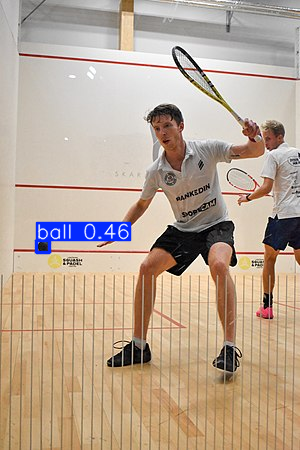

In [ ]:
# Execute prediction for specified categories on an image
results = model.predict("https://upload.wikimedia.org/wikipedia/commons/thumb/2/2b/Semifinal_Squash_SM_2021.jpg/300px-Semifinal_Squash_SM_2021.jpg")

# Show results
results[0].show()

## Yolo-World does not know my robot


image 1/1 /content/Screenshot 2024-12-10 145125.png: 640x640 (no detections), 117.3ms
Speed: 14.9ms preprocess, 117.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


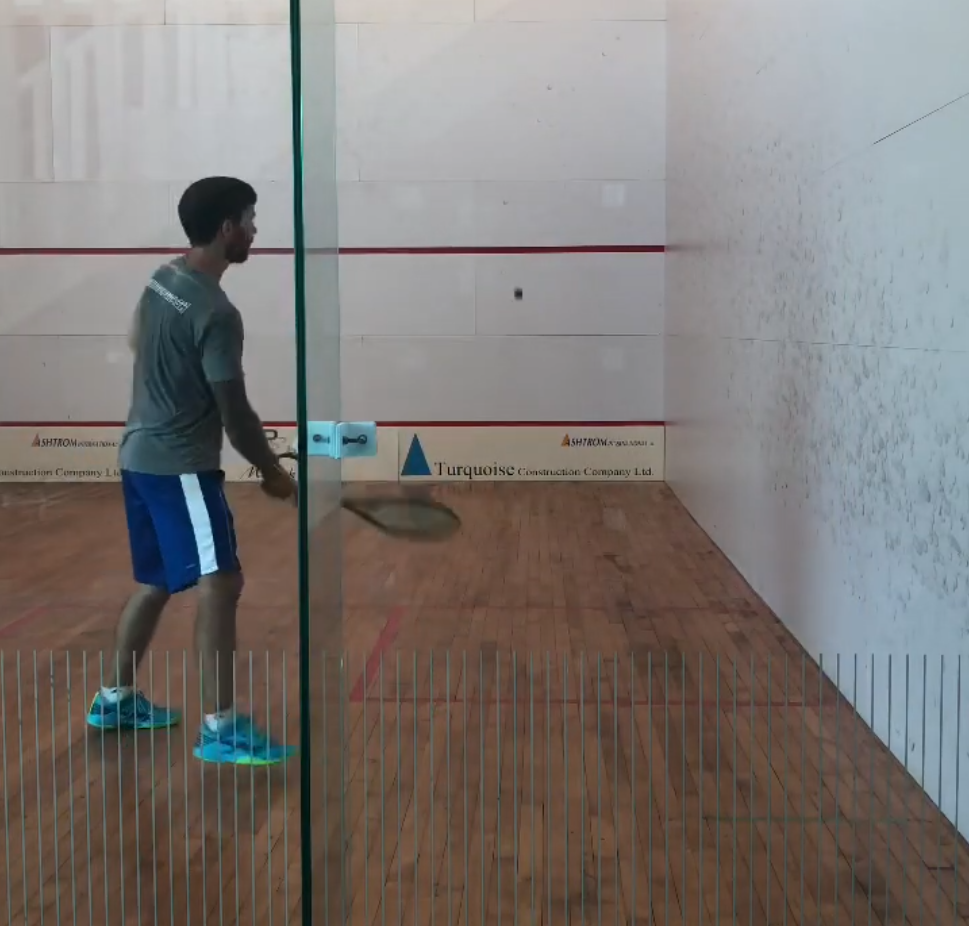

In [ ]:
IMG_PATH = "/content/Screenshot 2024-12-10 145125.png"

# Execute prediction for specified categories on an image
results = model.predict(IMG_PATH)

# Show results
results[0].show()

# Try SAM 2

## Create the SAM 2 Predictor

In [ ]:
"""
Hyper parameters
"""
SAM2_CHECKPOINT = "./checkpoints/sam2.1_hiera_large.pt"
SAM2_MODEL_CONFIG = "configs/sam2.1/sam2.1_hiera_l.yaml"
GROUNDING_DINO_CONFIG = "grounding_dino/groundingdino/config/GroundingDINO_SwinT_OGC.py"
GROUNDING_DINO_CHECKPOINT = "gdino_checkpoints/groundingdino_swint_ogc.pth"
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
OUTPUT_DIR = Path("outputs/grounded_sam2_local_demo")
DUMP_JSON_RESULTS = True

# create output directory
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# build SAM2 image predictor
sam2_checkpoint = SAM2_CHECKPOINT
model_cfg = SAM2_MODEL_CONFIG
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=DEVICE)
sam2_predictor = SAM2ImagePredictor(sam2_model)

# build grounding dino model
grounding_model = load_model(
    model_config_path=GROUNDING_DINO_CONFIG,
    model_checkpoint_path=GROUNDING_DINO_CHECKPOINT,
    device=DEVICE
)

final text_encoder_type: bert-base-uncased


## Fail: Scooters are not robots (yet)

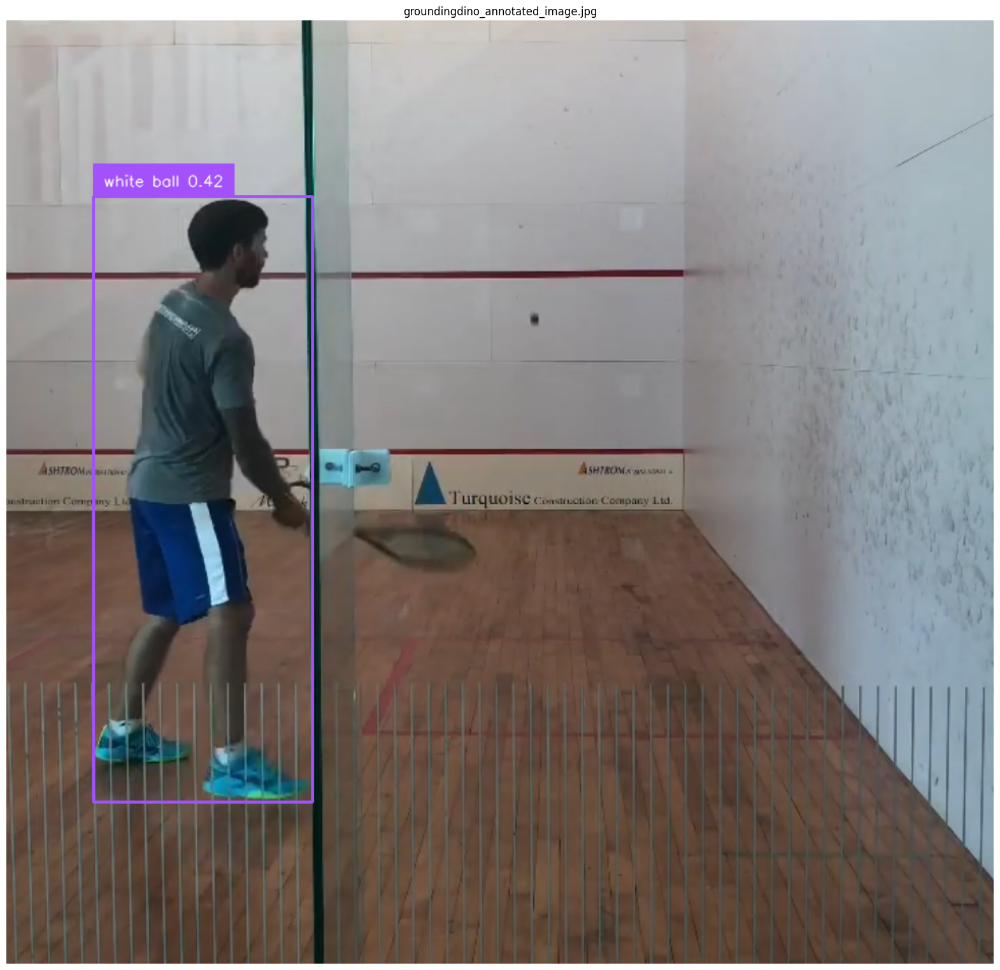

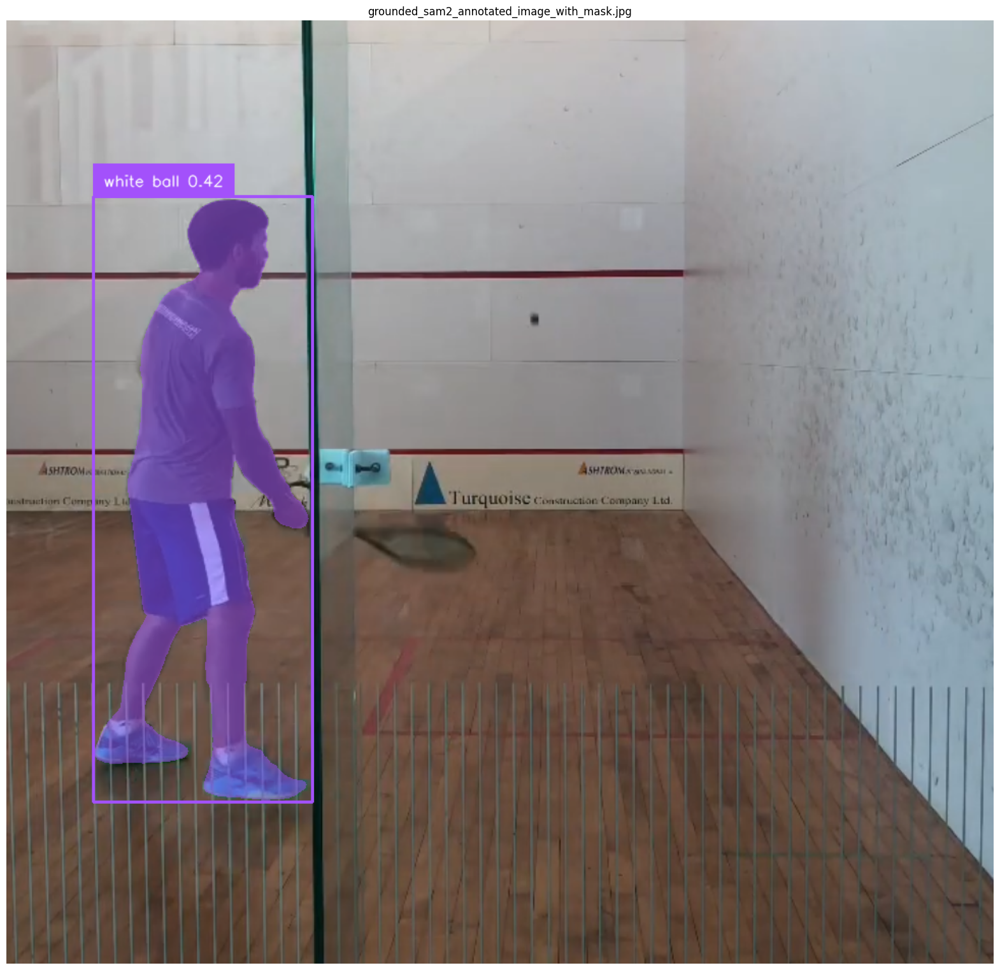

In [ ]:
TEXT_PROMPT = "white ball."
IMG_PATH = "/content/Screenshot 2024-12-10 145125.png"

inference(TEXT_PROMPT, IMG_PATH)

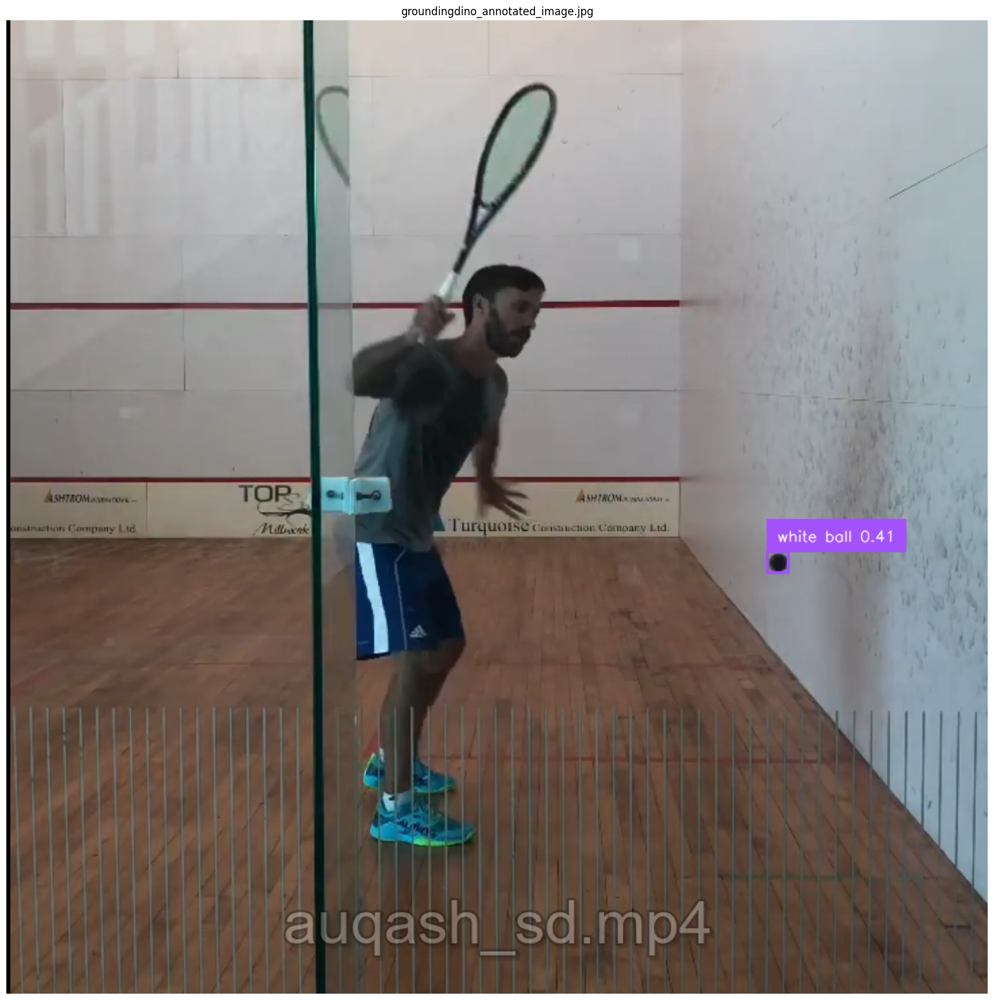

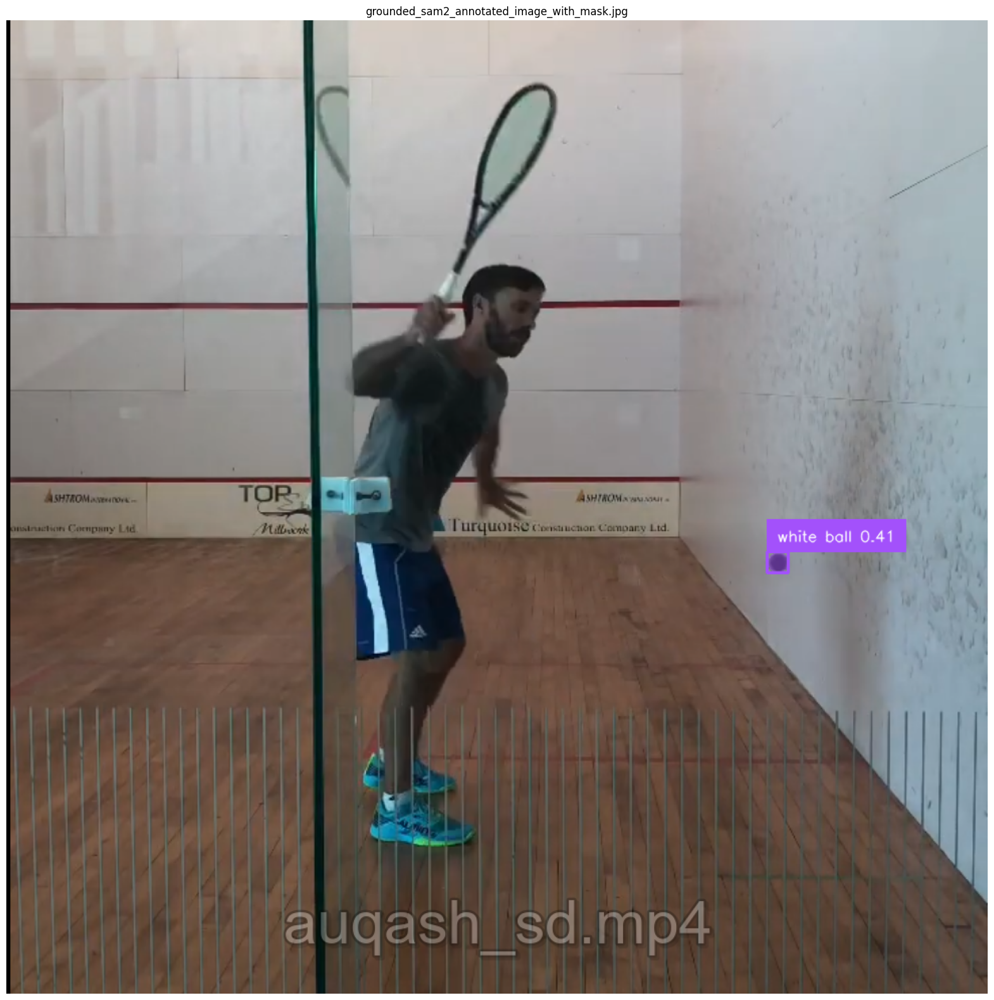

In [ ]:
# setup the input image and text prompt for SAM 2 and Grounding DINO
# VERY important: text queries need to be lowercased + end with a dot
TEXT_PROMPT = "white ball"
IMG_PATH = "/content/Screenshot 2024-12-03 134327.png"

inference(TEXT_PROMPT, IMG_PATH)

## Success: It is not a robot, it is a 6-wheeled robot

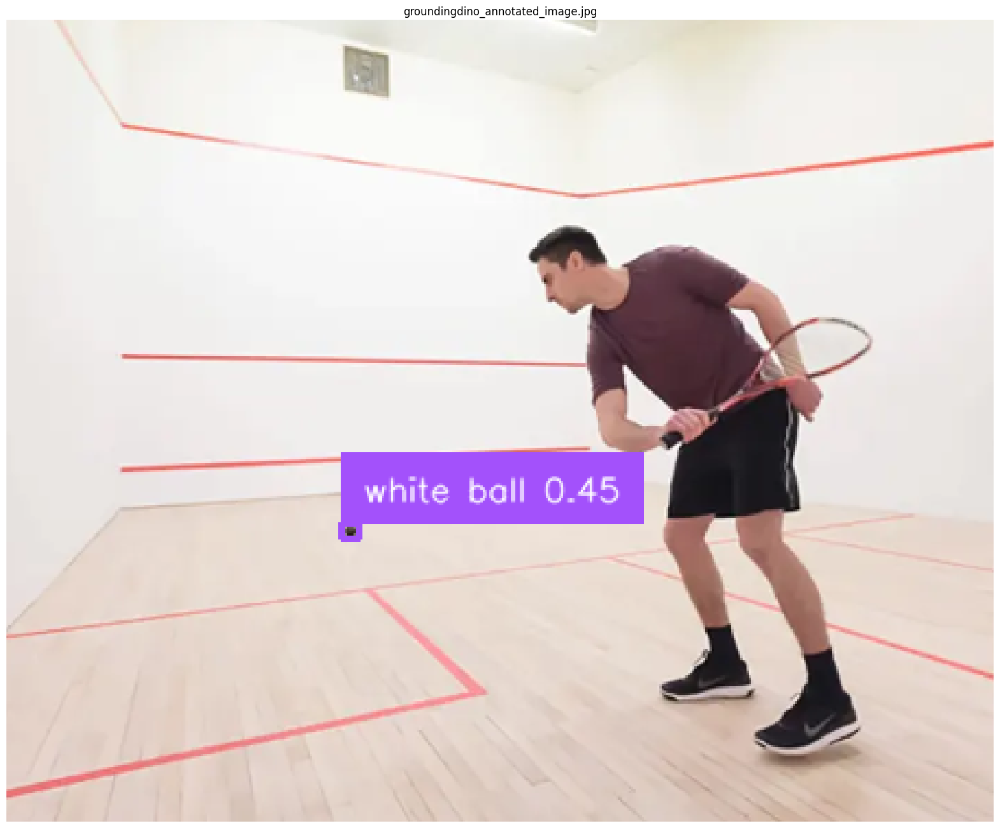

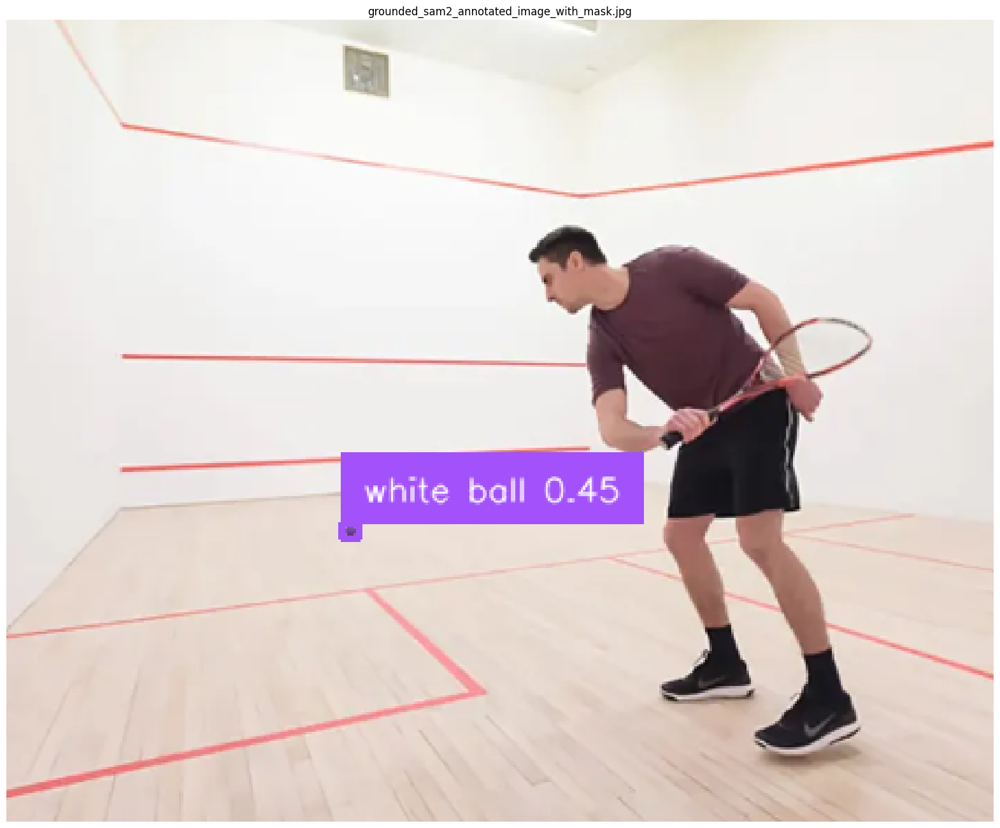

In [ ]:
TEXT_PROMPT = "white ball"
IMG_PATH = "/content/Screenshot 2024-12-03 172225.png"

inference(TEXT_PROMPT, IMG_PATH)

## Fail: But where is the LiDAR?

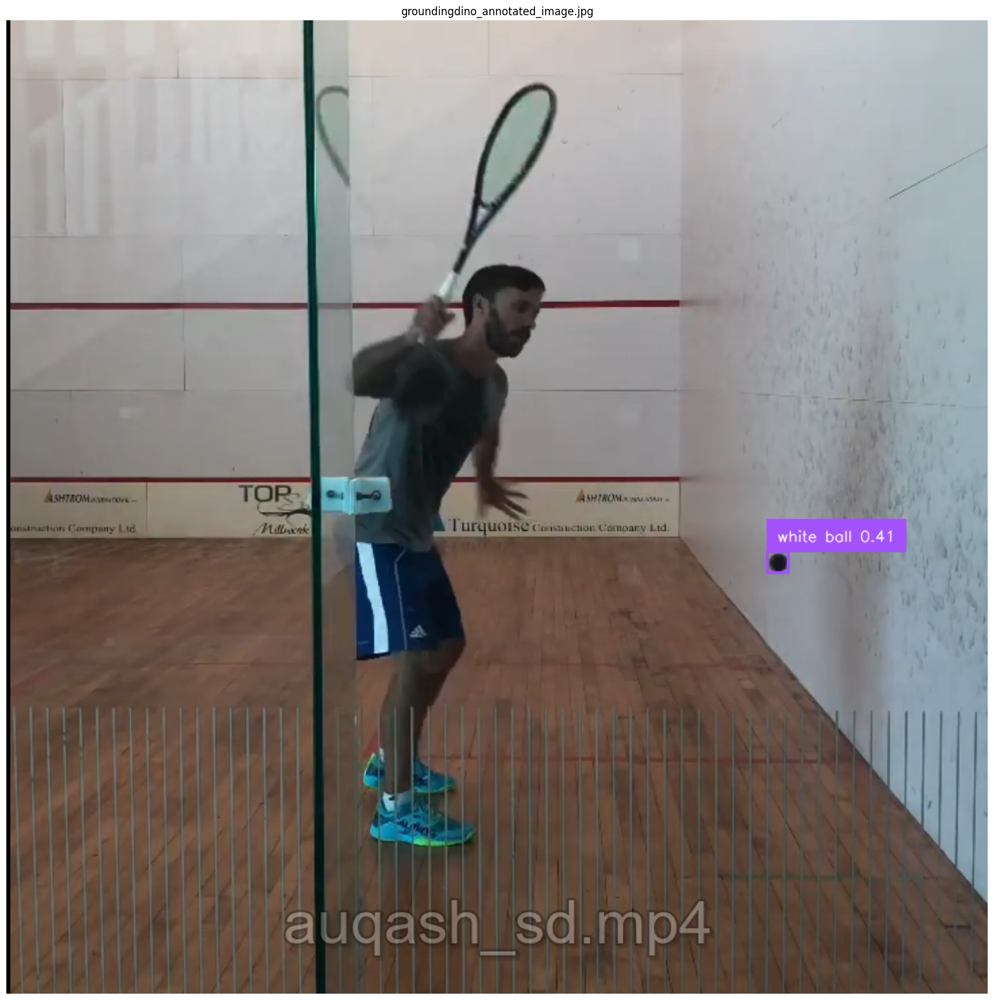

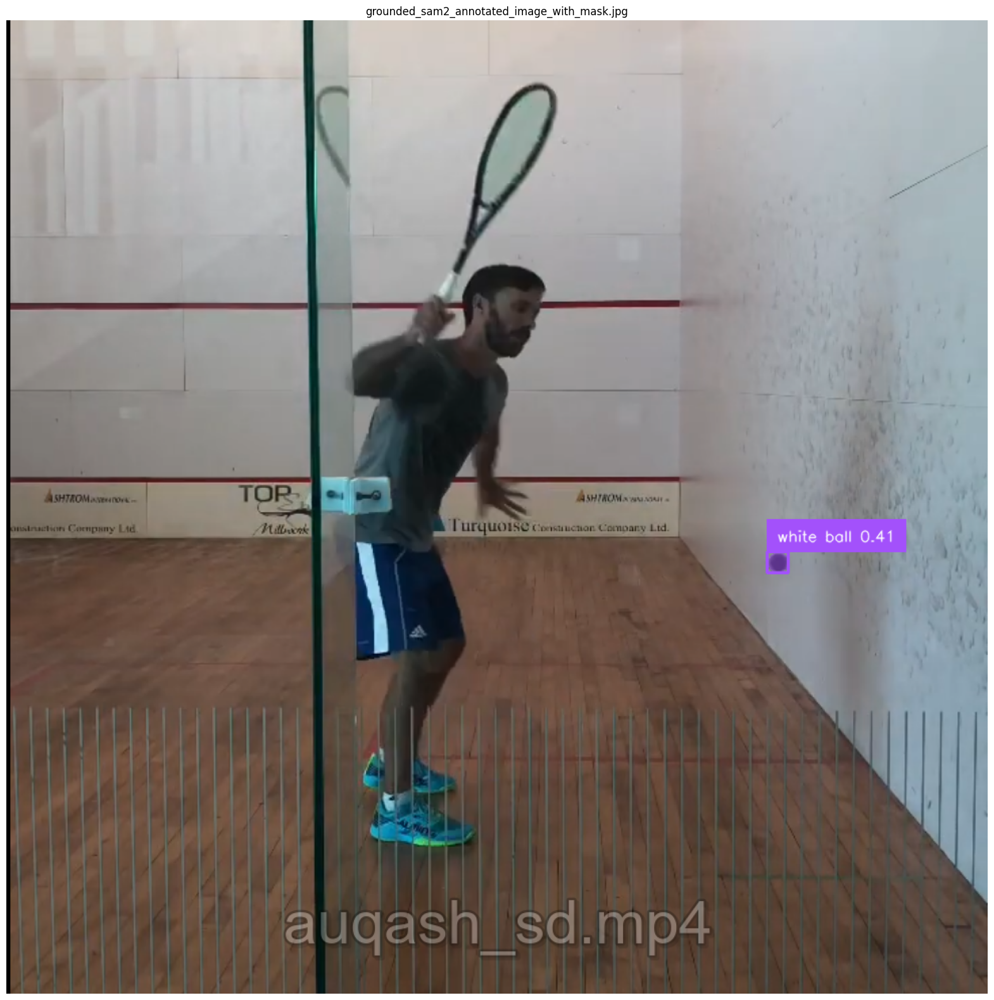

In [ ]:
TEXT_PROMPT = "white ball"
IMG_PATH = "/content/Screenshot 2024-12-03 134327.png"

inference(TEXT_PROMPT, IMG_PATH)